In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
total = pd.read_csv('/home/shared/splus_gaia/data/h-alpha-selection-marina/MC/halpha_emitters_mc_simbad_and_all_dist.csv')

In [3]:
len(total)

43296

In [4]:
total.columns

Index(['Unnamed: 0', 'id_x', 'ra', 'dec', 'parallax', 'gaia_ruwe',
       'gaia_parallax_over_error', 'gaia_classprob_dsc_combmod_star',
       'gaia_in_qso_candidates', 'gaia_in_galaxy_candidates',
       ...
       'gaia_source_id', 'flag_be_star_figueiredo', 'source_id', 'r_med_geo',
       'r_lo_geo', 'r_hi_geo', 'r_med_photogeo', 'r_lo_photogeo',
       'r_hi_photogeo', 'flag'],
      dtype='object', length=109)

In [7]:
be_10k = pd.read_csv('/home/shared/splus_gaia/notebooks/magellanic_clouds/studying_diff_objs/selecting_stars_below_be.csv')

In [6]:
be_10k = be_10k[be_10k['r_med_photogeo']>10000]

In [14]:
be_10k

,col1,id_x,ra,dec,parallax,gaia_ruwe,gaia_parallax_over_error,gaia_classprob_dsc_combmod_star,gaia_in_qso_candidates,gaia_in_galaxy_candidates,...,gaia_source_id,flag_be_star_figueiredo,source_id,r_med_geo,r_lo_geo,r_hi_geo,r_med_photogeo,r_lo_photogeo,r_hi_photogeo,flag
0,15105,b'i06MC00450085A',2.059697,-70.198880,-0.041087,0.983737,-1.542946,1.000000,0,0,...,4702938581521835648,0,4702938581521835648,20300.32230,14841.95410,26906.7012,27678.4375,17190.80080,33119.9570,10122
9,1673,b'i06MC013302U8R',4.419611,-74.369316,-0.042945,0.971261,-1.659598,0.999999,0,0,...,4688405752228450176,0,4688405752228450176,24636.25390,16500.06450,32438.0117,22800.2129,18446.74020,26242.6816,10022
10,1684,b'i06MC01330428W',4.420681,-74.088790,-0.130635,1.019477,-1.619155,0.999998,0,0,...,4688463266128125824,0,4688463266128125824,11784.96000,8740.82422,15196.2422,12209.3828,7984.17676,16049.0293,10022
11,322,b'i06MC011300C7H',4.420975,-74.088920,-0.130635,1.019477,-1.619155,0.999998,0,0,...,4688463266128125824,0,4688463266128125824,11784.96000,8740.82422,15196.2422,12209.3828,7984.17676,16049.0293,10022
13,375,b'i06MC011304SJS',4.838119,-73.146454,-0.010418,1.042834,-0.428388,1.000000,0,0,...,4688748559334975872,0,4688748559334975872,17331.31250,12863.50490,23738.2109,10546.9307,10067.77150,10956.9160,10022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19180,2489,b'i06MC006804BV6',93.757140,-69.505270,0.013928,1.006685,0.468319,0.999987,0,0,...,5279563882611899904,0,5279563882611899904,12563.52640,10147.38180,16980.8281,11207.4238,9329.27832,13447.6299,10022
19184,20377,b'i06MC003602JG2',94.251010,-67.396760,-0.041540,1.055213,-1.178270,0.999946,0,0,...,5283173785444034560,0,5283173785444034560,15151.16410,11696.57910,20863.3691,10414.3779,9198.48828,11599.5537,10022
19190,15024,b'i06MC004403A0Z',94.862810,-68.510450,0.020158,0.961230,1.111371,0.999998,0,0,...,5279877483956492288,0,5279877483956492288,15079.25590,11982.31740,18646.0391,15942.3477,12503.51170,20192.8555,10022
19193,20383,b'i06MC0036059Y6',95.354080,-66.859350,-0.006476,0.987081,-0.320364,0.000004,0,0,...,5283260749955838080,0,5283260749955838080,20641.65620,15108.86620,33595.1250,12995.7588,10918.26370,15043.8516,10022


In [7]:
be_10k.to_csv('/home/shared/splus_gaia/notebooks/magellanic_clouds/studying_diff_objs/selecting_stars_below_be_dist_great10kpc.csv')

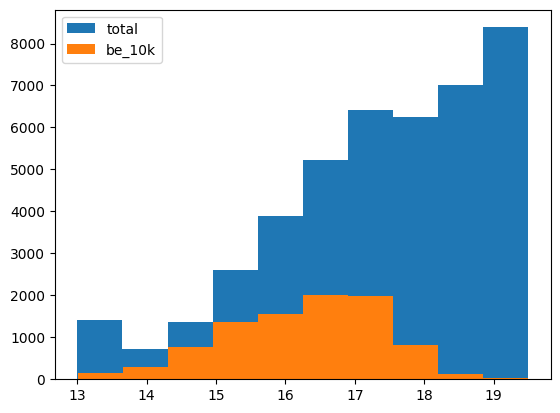

In [12]:
plt.hist(total['mag_psf_r'], label='total')
plt.hist(be_10k['mag_psf_r'], label='be_10k')
plt.legend()

In [38]:
import plotly.express as px

fig = px.scatter_3d(
    total,
    x="ra",
    y="dec",
    z="r_med_photogeo",
    color="r_med_photogeo",  # opcional: colore pela distância
    size_max=0.2,              # tamanho máximo dos pontos
    opacity=0.8
)

fig.update_layout(
    scene=dict(
        xaxis_title="RA (graus)",
        yaxis_title="Dec (graus)",
        zaxis_title="r_med_photogeo (pc?)",
    )
)

fig.show()

In [58]:
import plotly.express as px
from plotly.subplots import make_subplots

# Copia para não mexer no df original
total_plot = total.copy()

# Se r_med_photogeo estiver em pc, converte para kpc
total_plot["dist_kpc"] = total_plot["r_med_photogeo"] / 1000.0

# Definição das faixas em kpc
ranges = [
    (0, 2),
    (2,6), 
    (6,10),
    (10, 20),
    (20, 30),
    (30, 40),
    (40, 60)
]

titles = [f"{dmin}–{dmax} kpc" for dmin, dmax in ranges]

# Criando figura com 3 colunas e 2 linhas
fig = make_subplots(
    rows=2,
    cols=4,
    subplot_titles=titles
)

# Indexadores de subplot
row = 1
col = 1

for (dmin, dmax), subtitle in zip(ranges, titles):
    mask = (total_plot["dist_kpc"] >= dmin) & (total_plot["dist_kpc"] < dmax)
    df_slice = total_plot[mask]

    scatter_fig = px.scatter(df_slice, x="ra", y="dec", opacity=0.75)

    fig.add_trace(
        scatter_fig.data[0],
        row=row,
        col=col
    )

    # Atualiza os títulos dos eixos
    fig.update_xaxes(title_text="RA (deg)", autorange="reversed", row=row, col=col)
    fig.update_yaxes(title_text="Dec (deg)", row=row, col=col)

    col += 1
    if col > 4:
        col = 1
        row += 1

fig.update_layout(
    height=900,
    width=1400,
    showlegend=False,
    title="Distribuição RA×Dec por faixas de distância",
)

fig.show()

# gaia proper motion filters

In [63]:
import numpy as np
import pandas as pd
from astroquery.gaia import Gaia


def query_gaia_edr3_by_id(
    gaia_ids,
    *,
    chunk_size=2000,
    verbose=True,
):
    """
    Query Gaia EDR3 gaia_source table by source_id.

    Parameters
    ----------
    gaia_ids : array-like
        Iterable of Gaia source_id (ints).
    chunk_size : int
        Number of IDs per TAP query (keep <= 2000).
    verbose : bool
        Print progress.

    Returns
    -------
    pandas.DataFrame
        Gaia table with astrometry + errors.
    """

    gaia_ids = np.asarray(gaia_ids, dtype=np.int64)
    gaia_ids = np.unique(gaia_ids)

    results = []

    for i in range(0, len(gaia_ids), chunk_size):
        chunk = gaia_ids[i:i + chunk_size]

        ids_sql = ",".join(map(str, chunk))

        query = f"""
        SELECT
            source_id AS gaia_id,
            ra, dec,
            pmra, pmdec,
            pmra_error, pmdec_error,
            parallax, parallax_error,
            phot_g_mean_mag
        FROM gaiaedr3.gaia_source
        WHERE source_id IN ({ids_sql})
        """

        if verbose:
            print(f"Querying Gaia EDR3 IDs {i}–{i + len(chunk)}")

        job = Gaia.launch_job_async(query)
        tbl = job.get_results()
        results.append(tbl.to_pandas())

    if not results:
        return pd.DataFrame()

    return pd.concat(results, ignore_index=True)

In [64]:
# your dataframe
# df["gaia_id"] must exist
gaia_ids = be_10k["gaia_source_id"].dropna().astype("int64")

gaia_df = query_gaia_edr3_by_id(gaia_ids)

Querying Gaia EDR3 IDs 0–2000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 2000–4000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 4000–6000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 6000–8000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 8000–10000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 10000–12000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 12000–14000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 14000–16000
INFO: Query finished. [astroquery.utils.tap.core]
Querying Gaia EDR3 IDs 16000–17359
INFO: Query finished. [astroquery.utils.tap.core]


In [65]:
df2 = be_10k.merge(
    gaia_df,
    left_on="gaia_source_id",
    right_on = 'gaia_id',
    how="left",
    validate="m:1",
)

In [62]:
import numpy as np
import pandas as pd

from astropy import units as u
from astropy.coordinates import SkyCoord, SkyOffsetFrame


# -------------------------
# Helpers
# -------------------------
def _angular_separation_deg(ra, dec, ra0_deg, dec0_deg):
    c = SkyCoord(ra=ra*u.deg, dec=dec*u.deg, frame="icrs")
    c0 = SkyCoord(ra=ra0_deg*u.deg, dec=dec0_deg*u.deg, frame="icrs")
    return c.separation(c0).deg



def project_offsets_and_pms(
    df,
    ra0_deg,
    dec0_deg,
    *,
    ra_col="ra_y",
    dec_col="dec_y",
    pmra_col="gaia_pmra",
    pmdec_col="gaia_pmdec",
):
    """
    Project Gaia EDR3 sources into a tangent plane centered at (ra0, dec0),
    returning offsets (deg) and proper motions (mas/yr) in that frame.
    """

    c0 = SkyCoord(ra=ra0_deg * u.deg, dec=dec0_deg * u.deg, frame="icrs")
    off = SkyOffsetFrame(origin=c0)

    c = SkyCoord(
        ra=df[ra_col].to_numpy() * u.deg,
        dec=df[dec_col].to_numpy() * u.deg,
        pm_ra_cosdec=df[pmra_col].to_numpy() * (u.mas / u.yr),
        pm_dec=df[pmdec_col].to_numpy() * (u.mas / u.yr),
        frame="icrs",
    )

    co = c.transform_to(off)

    return (
        co.lon.to_value(u.deg),
        co.lat.to_value(u.deg),
        co.pm_lon_coslat.to_value(u.mas / u.yr),
        co.pm_lat.to_value(u.mas / u.yr),
    )


def _robust_cov_2d(x, y):
    """Median-centered covariance (robust-ish)."""
    xm = np.nanmedian(x)
    ym = np.nanmedian(y)
    X = np.vstack([x - xm, y - ym])
    # ignore NaNs
    mask = np.isfinite(X).all(axis=0)
    X = X[:, mask]
    cov = np.cov(X)
    return xm, ym, cov


def _mahalanobis2(dx, dy, cov):
    """Squared Mahalanobis distance for 2D."""
    icov = np.linalg.inv(cov)
    v = np.vstack([dx, dy])  # shape (2, N)
    # m2_i = v_i^T icov v_i
    return np.einsum("ij,jk,ik->i", v.T, icov, v.T)


# -------------------------
# Main selection
# -------------------------
def select_mc_clean_sample(
    df: pd.DataFrame,
    cloud: str,
    *,
    # column names (YOUR schema)
    ra_col="ra_y",
    dec_col="dec_y",
    parallax_col="parallax_y",
    pmra_col="pmra",
    pmdec_col="pmdec",
    gmag_col="phot_g_mean_mag",
    # selection parameters
    g_max_base: float = 20.5,
    rho_max_deg_for_pm_est: float = 10.0,
    parallax_max_mas: float = 0.2,
    g_max_for_pm_est: float = 19.0,
    k_sigma_pm: float = 3.0,
):
    """
    Reproduce Sect. 2 sample selection of
    'Gaia EDR3: Structure and properties of the Magellanic Clouds'
    """

    cloud = cloud.upper()
    if cloud not in ("LMC", "SMC"):
        raise ValueError("cloud must be 'LMC' or 'SMC'")

    # --- Centers & radii (Sect. 2.1) ---
    if cloud == "LMC":
        ra0, dec0, radius_deg = 81.28, -69.78, 20.0
    else:
        ra0, dec0, radius_deg = 12.80, -73.15, 11.0

    # --- Check required columns ---
    required = [ra_col, dec_col, parallax_col, pmra_col, pmdec_col, gmag_col]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise KeyError(f"Missing required columns: {missing}")

    work = df.copy()

    # --- Sect 2.1: base sample ---
    sep_deg = _angular_separation_deg(
        work[ra_col].to_numpy(),
        work[dec_col].to_numpy(),
        ra0,
        dec0,
    )

    m_base = (
        (sep_deg <= radius_deg) &
        np.isfinite(work[parallax_col].to_numpy()) &
        (work[gmag_col].to_numpy() < g_max_base)
    )
    base = work.loc[m_base].copy()

    # --- Sect 2.2: projection ---
    lon, lat, pmx, pmy = project_offsets_and_pms(
        base,
        ra0,
        dec0,
        ra_col=ra_col,
        dec_col=dec_col,
        pmra_col=pmra_col,
        pmdec_col=pmdec_col,
    )

    base["lon_off_deg"] = lon
    base["lat_off_deg"] = lat
    base["pmx_off_masyr"] = pmx
    base["pmy_off_masyr"] = pmy

    rho_deg = np.sqrt(lon**2 + lat**2)

    # --- PM estimation subset ---
    m_pm_est = (
        (rho_deg <= rho_max_deg_for_pm_est) &
        (base[parallax_col].to_numpy() < parallax_max_mas) &
        # (base[gmag_col].to_numpy() < g_max_for_pm_est) &
        np.isfinite(pmx) &
        np.isfinite(pmy)
    )
    pm_est = base.loc[m_pm_est]

    mu_x, mu_y, cov = _robust_cov_2d(
        pm_est["pmx_off_masyr"].to_numpy(),
        pm_est["pmy_off_masyr"].to_numpy(),
    )

    # --- PM ellipse cut ---
    dx = base["pmx_off_masyr"].to_numpy() - mu_x
    dy = base["pmy_off_masyr"].to_numpy() - mu_y
    m2 = _mahalanobis2(dx, dy, cov)

    m_clean = (
        (base[parallax_col].to_numpy() < parallax_max_mas) &
        (m2 <= 9.21)
    )

    clean = base.loc[m_clean].copy()

    debug = {
        "cloud": cloud,
        "pm_median_x": float(mu_x),
        "pm_median_y": float(mu_y),
        "pm_cov": cov,
        "n_input": len(df),
        "n_base": len(base),
        "n_pm_est": len(pm_est),
        "n_clean": len(clean),
    }

    return clean, debug

In [67]:
# df = your Gaia table as a pandas DataFrame

clean_lmc, dbg_lmc = select_mc_clean_sample(
    df2,
    "LMC",
    rho_max_deg_for_pm_est=5.0,   # set to paper’s exact value for LMC
    parallax_max_mas=0.2,          # set to paper’s exact value
    g_max_for_pm_est=19.0,         # set to paper’s exact value
    k_sigma_pm=3.0,                # tune to match their confidence region
)

clean_smc, dbg_smc = select_mc_clean_sample(
    df2,
    "SMC",
    rho_max_deg_for_pm_est=1.5,    # set to paper’s exact value for SMC
    parallax_max_mas=0.2,
    g_max_for_pm_est=19.0,
    k_sigma_pm=3.0,
)

print(dbg_lmc)
print(dbg_smc)

{'cloud': 'LMC', 'pm_median_x': 1.7271826764969311, 'pm_median_y': 0.33883033669077695, 'pm_cov': array([[ 0.08040049, -0.00680781],
       [-0.00680781,  0.08844541]]), 'n_input': 19212, 'n_base': 14883, 'n_pm_est': 12469, 'n_clean': 14020}
{'cloud': 'SMC', 'pm_median_x': 0.6650959306293595, 'pm_median_y': -1.2673095596826436, 'pm_cov': array([[ 0.07094951, -0.01680368],
       [-0.01680368,  0.05029202]]), 'n_input': 19212, 'n_base': 6143, 'n_pm_est': 3857, 'n_clean': 5735}


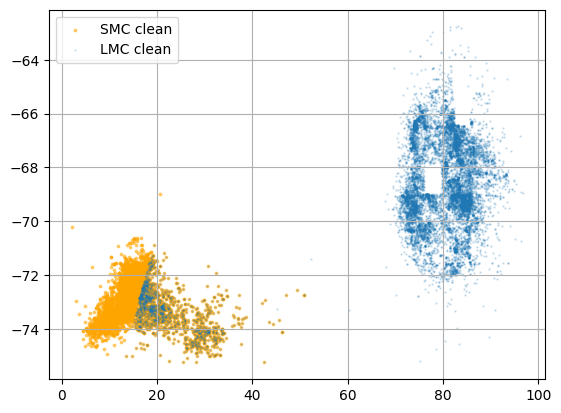

In [68]:

plt.grid()
plt.scatter(
    clean_smc["ra_y"],
    clean_smc["dec_y"],
    s=3,
    alpha=0.5,
    label="SMC clean",
    color = 'orange'
)

plt.scatter(
    clean_lmc["ra_y"],
    clean_lmc["dec_y"],
    s=0.5,
    alpha=0.2,
    label="LMC clean",
)

plt.legend()


In [9]:
from astropy.table import Table

table = Table.read("/home/shared/splus_gaia/data/h-alpha-selection-marina/gutierrez-soto25.fit")

gut = table.to_pandas()

Note (2)  : Class_SPLUS: Clustering groups (S-PLUS only) as follows:
0 =	QSO-dominated
1 =	RR Lyrae/EB*
2 =	EB*/Stars
3 =	AGN/QSO
4 =	QSO/CataclyV*

In [10]:
gut

,_RAJ2000,_DEJ2000,recno,ID,RAJ2000,DEJ2000,umag,e_umag,J0378mag,e_J0378mag,...,W1mag,e_W1mag,W2mag,e_W2mag,UMAP1-S,UMAP2-S,Class-S,UMAP1-S_W,UMAP2-S_W,Class-S_W
0,151.228065,-24.565880,1,b'iDR4_3_HYDRA-0011_0001534 ',151.228065,-24.565880,18.507275,0.025391,17.930260,0.026517,...,12.721,12.724,0.025,0.026,-5.442610,7.757478,2,12.202629,2.276409,0
1,151.820602,-25.619486,2,b'iDR4_3_HYDRA-0021_0019499 ',151.820602,-25.619486,14.610666,0.003569,13.971252,0.003195,...,11.982,12.008,0.023,0.023,-2.864902,15.890389,1,7.046351,8.736568,0
2,154.612704,-25.530006,3,b'iDR4_3_HYDRA-0023_0021195 ',154.612704,-25.530006,16.387249,0.007846,16.096981,0.009325,...,12.399,12.400,0.023,0.023,-6.490024,10.687394,2,11.147096,4.682925,0
3,158.459389,-24.620632,4,b'iDR4_3_HYDRA-0026_0046098 ',158.459389,-24.620632,17.200853,0.011627,16.875017,0.013714,...,12.834,12.822,0.025,0.028,-6.868538,9.669092,2,12.216504,4.232417,0
4,150.917736,-26.667847,5,b'iDR4_3_HYDRA-0031_0032774 ',150.917736,-26.667847,16.868654,0.010218,16.484432,0.010758,...,13.721,13.789,0.025,0.033,-4.440413,15.294579,2,8.234937,8.145382,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3632,349.808612,-0.962720,3633,b'iDR4_3_STRIPE82-0157_0016873',349.808612,-0.962720,23.211632,0.998384,21.594254,0.370379,...,16.195,16.220,0.068,0.232,0.000000,0.000000,0,0.000000,0.000000,0
3633,350.254869,0.323001,3634,b'iDR4_3_STRIPE82-0158_0009177',350.254869,0.323001,19.933153,0.074456,19.495451,0.080418,...,15.299,13.822,0.041,0.039,12.468115,4.402364,4,-0.326460,8.711914,4
3634,352.418578,0.670626,3635,b'iDR4_3_STRIPE82-0162_0018498',352.418578,0.670626,21.753021,0.515379,23.583510,3.607970,...,15.599,15.443,0.047,0.127,0.000000,0.000000,0,0.000000,0.000000,0
3635,354.578466,-0.927664,3636,b'iDR4_3_STRIPE82-0163_0014886',354.578466,-0.927664,22.497034,1.197170,21.295042,94.965540,...,16.318,16.087,0.072,0.197,0.000000,0.000000,0,0.000000,0.000000,0


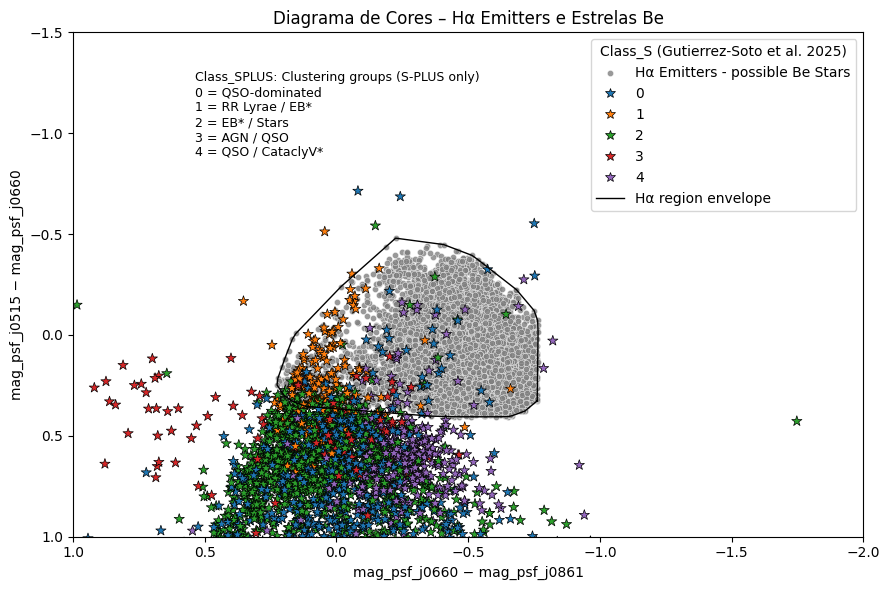

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 6))

# be_10k
sns.scatterplot(
    x=be_10k['mag_psf_j0660'] - be_10k['mag_psf_j0861'],
    y=be_10k['mag_psf_j0515'] - be_10k['mag_psf_j0660'],
    label='Hα Emitters - possible Be Stars',
    color='gray',
    s=20,
    alpha=0.8,
    ax=ax
)

# Gutierrez-Soto et al. 2025
sns.scatterplot(
    x=gut['J0660mag'] - gut['J0861mag'],
    y=gut['J0515mag'] - gut['J0660mag'],
    hue=gut['Class-S'],
    palette='tab10',
    s=60,
    marker='*',
    edgecolor='black',
    linewidth=0.5,
    ax=ax
)

from scipy.spatial import ConvexHull

x_gray = be_10k['mag_psf_j0660'] - be_10k['mag_psf_j0861']
y_gray = be_10k['mag_psf_j0515'] - be_10k['mag_psf_j0660']


points = np.column_stack([x_gray, y_gray])
hull = ConvexHull(points)

# Fecha o polígono
hull_points = points[hull.vertices]
hull_points = np.vstack([hull_points, hull_points[0]])

ax.plot(
    hull_points[:, 0],
    hull_points[:, 1],
    color='black',
    linewidth=1,
    label='Hα region envelope'
)

ax.set_ylim(1, -1.5)
ax.set_xlim(1, -2)

ax.set_xlabel('mag_psf_j0660 − mag_psf_j0861')
ax.set_ylabel('mag_psf_j0515 − mag_psf_j0660')
ax.set_title('Diagrama de Cores – Hα Emitters e Estrelas Be')

ax.legend(title='Class_S (Gutierrez-Soto et al. 2025)', loc='upper right')

# =========================
# Nota fora do gráfico
# =========================
note_text = (
    "Class_SPLUS: Clustering groups (S-PLUS only)\n"
    "0 = QSO-dominated\n"
    "1 = RR Lyrae / EB*\n"
    "2 = EB* / Stars\n"
    "3 = AGN / QSO\n"
    "4 = QSO / CataclyV*"
)

fig.text(
    0.2, 0.8,           # posição fora do eixo, à direita
    note_text,
    ha='left',
    va='center',
    fontsize=9
)

plt.tight_layout(rect=[0, 0, 0.90, 1])  # reserva espaço para a nota
plt.show()

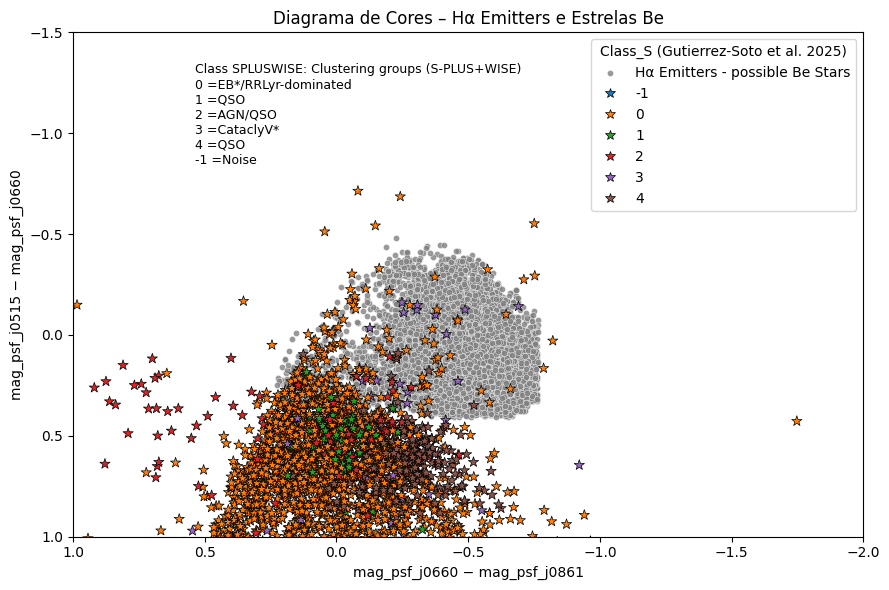

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 6))

# be_10k
sns.scatterplot(
    x=be_10k['mag_psf_j0660'] - be_10k['mag_psf_j0861'],
    y=be_10k['mag_psf_j0515'] - be_10k['mag_psf_j0660'],
    label='Hα Emitters - possible Be Stars',
    color='gray',
    s=20,
    alpha=0.8,
    ax=ax
)

# Gutierrez-Soto et al. 2025
sns.scatterplot(
    x=gut['J0660mag'] - gut['J0861mag'],
    y=gut['J0515mag'] - gut['J0660mag'],
    hue=gut['Class-S_W'],
    palette='tab10',
    s=60,
    marker='*',
    edgecolor='black',
    linewidth=0.5,
    ax=ax
)

ax.set_ylim(1, -1.5)
ax.set_xlim(1, -2)

ax.set_xlabel('mag_psf_j0660 − mag_psf_j0861')
ax.set_ylabel('mag_psf_j0515 − mag_psf_j0660')
ax.set_title('Diagrama de Cores – Hα Emitters e Estrelas Be')

ax.legend(title='Class_S (Gutierrez-Soto et al. 2025)', loc='upper right')

# =========================
# Nota fora do gráfico
# =========================
note_text = (
"Class SPLUSWISE: Clustering groups (S-PLUS+WISE)\n"
"0 =EB*/RRLyr-dominated \n"
"1 =QSO \n"
"2 =AGN/QSO \n"
"3 =CataclyV* \n"
"4 =QSO\n"
"-1 =Noise"
)

fig.text(
    0.2, 0.8,           # posição fora do eixo, à direita
    note_text,
    ha='left',
    va='center',
    fontsize=9
)

plt.tight_layout(rect=[0, 0, 0.90, 1])  # reserva espaço para a nota
plt.show()